In [34]:
import datetime
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import matplotlib.units as munits
import numpy as np

# Forecasting Lapa station temperature

In [35]:
cge = pd.read_csv("../data/processed/lapa2.csv")
cge = cge.dropna()

cge = cge.drop(["week", "day_of_month",], axis=1)

In [36]:
cge[["uhi"]].describe()

,uhi
count,25184.000000
mean,2.258898
std,1.834101
min,-9.891667
25%,1.192125
50%,2.261000
75%,3.210875
max,14.024333


In [37]:
ts = cge[["timestamp"]]
ts.head()

,timestamp
36,2016-01-23 02:00:00
37,2016-01-23 03:00:00
38,2016-01-23 04:00:00
39,2016-01-23 05:00:00
40,2016-01-23 06:00:00


In [38]:
def make_steps(df, y):
    for i in range(6):
        df[f"{y}_step_{i+1}"] = df[y].shift(-i+1)
    return df

y = make_steps(df=cge[["uhi"]], y="uhi").drop("uhi", axis=1)
y = y.dropna()

y

/tmp/ipykernel_1464/1613697006.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[f"{y}_step_{i+1}"] = df[y].shift(-i+1)
/tmp/ipykernel_1464/1613697006.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[f"{y}_step_{i+1}"] = df[y].shift(-i+1)
/tmp/ipykernel_1464/1613697006.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/

,uhi_step_1,uhi_step_2,uhi_step_3,uhi_step_4,uhi_step_5,uhi_step_6
37,2.454167,2.477667,2.489500,2.513333,2.578500,2.593333
38,2.477667,2.489500,2.513333,2.578500,2.593333,2.659167
39,2.489500,2.513333,2.578500,2.593333,2.659167,2.508000
40,2.513333,2.578500,2.593333,2.659167,2.508000,2.820000
41,2.578500,2.593333,2.659167,2.508000,2.820000,3.632333
...,...,...,...,...,...,...
26976,-2.556167,-2.317833,-2.705667,-3.261500,-0.678167,2.385333
26977,-2.317833,-2.705667,-3.261500,-0.678167,2.385333,2.933833
26978,-2.705667,-3.261500,-0.678167,2.385333,2.933833,3.944667
26979,-3.261500,-0.678167,2.385333,2.933833,3.944667,4.841000


In [39]:
X = cge.drop(["timestamp", "uhi", "precipitation", "temperature", "relative_humidity", "pressure", "wind_velocity_x", "wind_velocity_y", "wind_blow_x", "wind_blow_y"], axis=1)
X = X.loc[y.index.min():y.index.max()]
X

,uhi_outlier,precipitation_outlier,temperature_outlier,relative_humidity_outlier,pressure_outlier,wind_velocity_x_outlier,wind_velocity_y_outlier,wind_blow_x_outlier,wind_blow_y_outlier,month,...,wind_blow_x_outlier_window_24H_min,wind_blow_x_outlier_window_24H_max,wind_blow_y_outlier_window_24H_mean,wind_blow_y_outlier_window_24H_std,wind_blow_y_outlier_window_24H_min,wind_blow_y_outlier_window_24H_max,month_sin,month_cos,hour_sin,hour_cos
37,0,0,0,0,0,0,0,0,0,1,...,0.0,1.0,0.000000,0.000000,0.0,0.0,0.500000,0.866025,0.730836,0.682553
38,0,0,0,0,0,0,0,0,0,1,...,0.0,1.0,0.000000,0.000000,0.0,0.0,0.500000,0.866025,0.887885,0.460065
39,0,0,0,0,0,0,0,0,0,1,...,0.0,1.0,0.000000,0.000000,0.0,0.0,0.500000,0.866025,0.979084,0.203456
40,0,0,0,0,0,0,0,0,0,1,...,0.0,1.0,0.000000,0.000000,0.0,0.0,0.500000,0.866025,0.997669,-0.068242
41,0,0,0,0,0,0,0,0,0,1,...,0.0,1.0,0.000000,0.000000,0.0,0.0,0.500000,0.866025,0.942261,-0.334880
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26976,0,0,0,0,0,0,0,0,0,2,...,0.0,0.0,0.125000,0.337832,0.0,1.0,0.866025,0.500000,-0.631088,-0.775711
26977,0,0,0,0,0,0,0,0,0,2,...,0.0,0.0,0.125000,0.337832,0.0,1.0,0.866025,0.500000,-0.816970,-0.576680
26978,0,0,0,0,0,1,0,0,0,2,...,0.0,0.0,0.125000,0.337832,0.0,1.0,0.866025,0.500000,-0.942261,-0.334880
26979,0,0,0,0,0,0,1,0,0,2,...,0.0,0.0,0.083333,0.282330,0.0,1.0,0.866025,0.500000,-0.997669,-0.068242


In [40]:
ts = ts.loc[y.index.min():y.index.max()]
ts

,timestamp
37,2016-01-23 03:00:00
38,2016-01-23 04:00:00
39,2016-01-23 05:00:00
40,2016-01-23 06:00:00
41,2016-01-23 07:00:00
...,...
26976,2019-02-18 14:00:00
26977,2019-02-18 15:00:00
26978,2019-02-18 16:00:00
26979,2019-02-18 17:00:00


In [41]:
# the following code lines are necessary to import custom module
import os
import sys

module_path = os.path.abspath(os.path.join('..'))
if module_path not in sys.path:
    sys.path.append(module_path)

from src.models.forecasting import RidgeHyperoptTS, GBHyperoptTS
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error

from sklearn.model_selection import GridSearchCV
from sklearn.multioutput import RegressorChain
from sklearn.ensemble import HistGradientBoostingRegressor
from sklearn.linear_model import Ridge, RidgeCV
from sklearn.pipeline import Pipeline
from sklearn.model_selection import cross_val_score, TimeSeriesSplit

from skopt import BayesSearchCV
from skopt.space import Real, Integer

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, shuffle=False)

# model = RidgeHyperoptTS()
# model = GBHyperoptTS()

# model = RegressorChain(Ridge())
model = RegressorChain(RidgeCV())

# model = RegressorChain(
#     HistGradientBoostingRegressor( 
#         warm_start=True,
#         early_stopping=True,
#         random_state=123
#     )
# )

# parameters = {
#     'estimator__base_estimator__max_depth' : list(np.arange(4,16,2)),
#     'estimator__base_estimator__max_iter': list(np.arange(100,300,50)),
#     'estimator__base_estimator__learning_rate': [0.0001, 0.001, 0.01],
#     'estimator__base_estimator__min_samples_leaf': list(np.arange(20,80,20))
#     }

# parameters = {
#     'estimator__base_estimator__max_depth' : Integer(5, 30),
#     'estimator__base_estimator__max_iter': Integer(100, 300),
#     'estimator__base_estimator__learning_rate': Real(1e-6, 1e-2, prior='log-uniform'),
#     'estimator__base_estimator__min_samples_leaf': Integer(20, 60)
#     }

# pipeline = Pipeline(steps = [
#     ('estimator', RegressorChain(HistGradientBoostingRegressor()))
#     ]
# )

# grid_search_cv = GridSearchCV(
#     estimator=pipeline, 
#     param_grid=parameters,
#     cv=TimeSeriesSplit(n_splits=5), 
# )

# opt = BayesSearchCV(
#     estimator=pipeline, 
#     search_spaces=parameters,
#     cv=TimeSeriesSplit(n_splits=3),
#     n_iter=3,
#     random_state=123
# )

model.fit(X_train, y_train)

# opt.fit(X_train, y_train)

y_fit = pd.DataFrame(model.predict(X_train), index=X_train.index, columns=y.columns)
y_pred = pd.DataFrame(model.predict(X_test), index=X_test.index, columns=y.columns)

# y_fit = pd.DataFrame(grid_search_cv.predict(X_train), index=X_train.index, columns=y.columns)
# y_pred = pd.DataFrame(grid_search_cv.predict(X_test), index=X_test.index, columns=y.columns)

# y_fit = pd.DataFrame(opt.predict(X_train), index=X_train.index, columns=y.columns)
# y_pred = pd.DataFrame(opt.predict(X_test), index=X_test.index, columns=y.columns)

<AxesSubplot: xlabel='timestamp'>

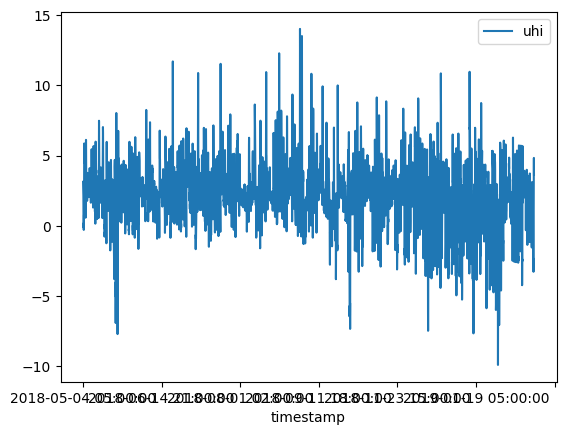

In [42]:
test = cge[X_test.index[0]:X_test.index[-1]][["timestamp", "uhi"]].set_index("timestamp")
test.plot()

In [43]:
test.index = pd.to_datetime(test.index)
test

,uhi
timestamp,
2018-05-04 05:00:00,3.140500
2018-05-04 06:00:00,2.944333
2018-05-04 07:00:00,2.880500
2018-05-04 08:00:00,2.551333
2018-05-04 09:00:00,2.148833
...,...
2019-02-18 18:00:00,2.385333
2019-02-18 19:00:00,2.933833
2019-02-18 20:00:00,3.944667


In [44]:
ts.timestamp = pd.to_datetime(ts.timestamp)
y_pred["timestamp"] = ts[y_pred.index[0]:y_pred.index[-1]]["timestamp"]
y_pred = y_pred.dropna()
y_pred

,uhi_step_1,uhi_step_2,uhi_step_3,uhi_step_4,uhi_step_5,uhi_step_6,timestamp
20008,3.146697,2.728892,2.395919,2.040335,1.760737,1.208456,2018-05-04 06:00:00
20009,2.930958,2.544461,2.107410,1.898761,1.360357,0.440032,2018-05-04 07:00:00
20010,2.873139,2.355336,2.105392,1.593913,0.645562,0.344909,2018-05-04 08:00:00
20011,2.558967,2.349846,1.862524,0.933897,0.540354,0.440784,2018-05-04 09:00:00
20012,2.161026,1.668994,0.893229,0.532550,0.332508,0.197986,2018-05-04 10:00:00
...,...,...,...,...,...,...,...
26976,-2.556858,-1.625618,-0.736305,-0.010315,1.098262,2.038058,2019-02-18 14:00:00
26977,-2.297897,-1.396010,-0.358608,1.004583,2.000044,2.632942,2019-02-18 15:00:00
26978,-2.702783,-1.798814,-0.078626,1.285369,2.261750,2.166230,2019-02-18 16:00:00
26979,-3.260085,-1.452713,0.282473,1.797016,2.188806,2.011051,2019-02-18 17:00:00


/tmp/ipykernel_1464/785206211.py:16: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(figsize=(9,3))


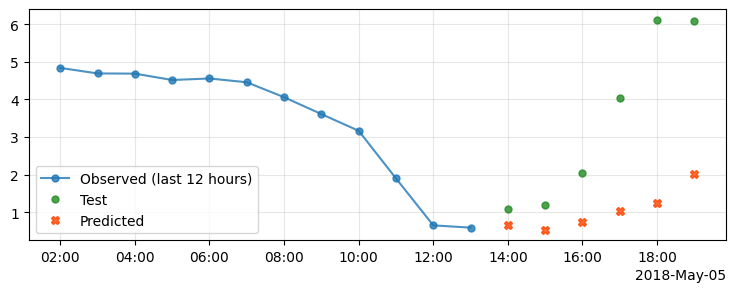

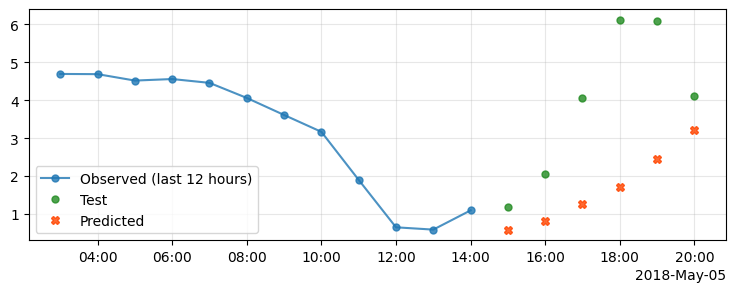

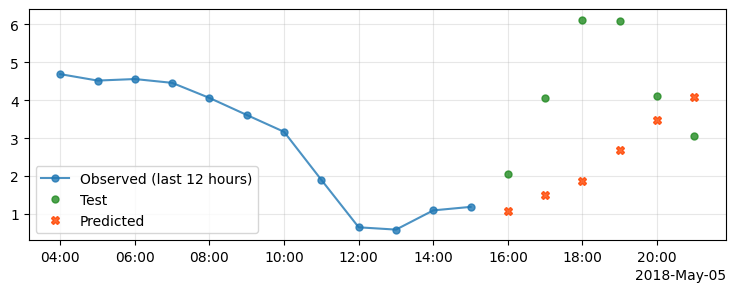

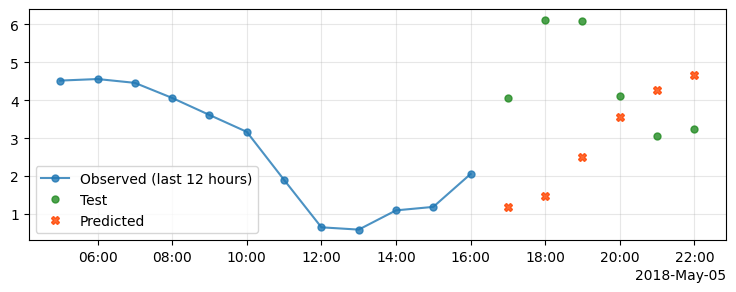

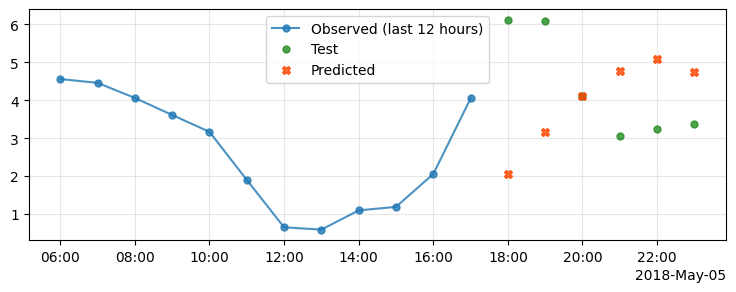

...

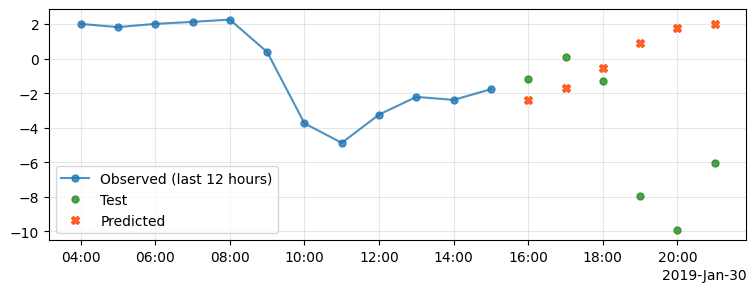

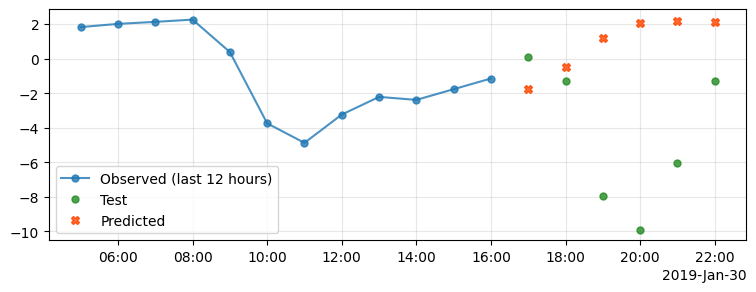

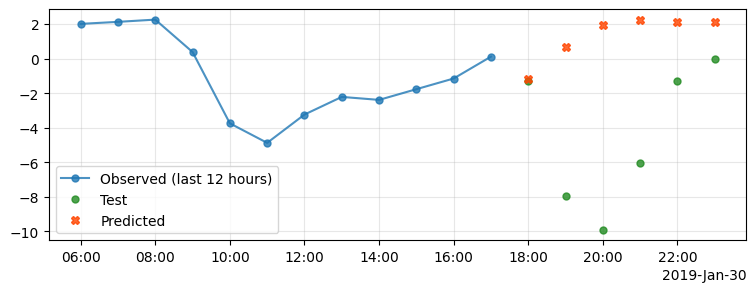

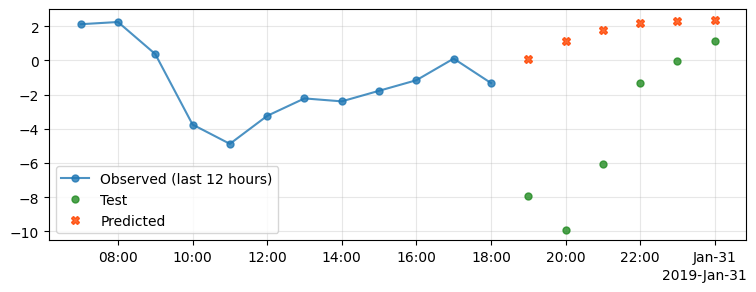

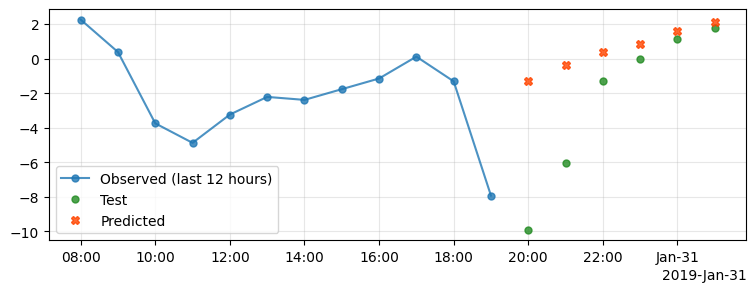

In [54]:
converter = mdates.ConciseDateConverter()
munits.registry[np.datetime64] = converter
munits.registry[datetime.date] = converter
munits.registry[datetime.datetime] = converter

for i in y_pred.index:
    pred = y_pred.loc[[i]]
    start_date = pred.timestamp.unique()[0] + np.timedelta64(1,'h')
    pred = pred.drop("timestamp", axis=1).T
    pred.index = pd.date_range(start=start_date, periods=6, freq="H")
    pred.columns = ["uhi"]
    past_data = 12
    train_plot = test[pred.index[0]-np.timedelta64(past_data,'h'):pred.index[0]-np.timedelta64(1,'h')]
    test_plot = test[pred.index[0]:pred.index[-1]]
    if sum(test_plot.uhi > 6) > 1 or sum(test_plot.uhi < -6) > 1:
        fig, ax = plt.subplots(figsize=(9,3))
        ax.plot(train_plot, label=f"Observed (last {past_data} hours)", marker=".", markersize=10, alpha=0.8)
        ax.plot(test_plot, label="Test", ls="", marker=".", markersize=10, color="forestgreen", alpha=0.8)
        ax.plot(pred, label="Predicted", ls="", marker="X", markersize=6, color="orangered", alpha=0.8)
        # ax.set_xticks(pd.concat([train_plot, test_plot]).reset_index().timestamp)
        ax.legend()
        ax.grid(alpha=0.3)

In [55]:
test_dfs = []
pred_dfs = []
mse = []
for i in y_pred.index:
    pred = y_pred.loc[[i]]
    start_date = pred.timestamp.unique()[0] + np.timedelta64(1,'h')
    pred = pred.drop("timestamp", axis=1).T
    pred.index = pd.date_range(start=start_date, periods=6, freq="H")
    pred.columns = ["uhi"]
    test_plot = test[pred.index[0]:pred.index[-1]]
    try:
        mse.append(mean_squared_error(test_plot, pred, squared=False))
        test_dfs.append(test_plot)
        pred_dfs.append(pred)
    except:
        pass

In [ ]:
# plt.figure(dpi=100, figsize=(5,5))
# plt.scatter(y_test, y_pred, alpha=0.4, label='Predictions')
# plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], '--', label='Perfect model', color='red')
# # plt.xlim(y_test.min(), y_test.max())
# # plt.ylim=(y_test.min(), y_test.max())
# plt.xlabel("Observed temp. (°C)")
# plt.ylabel("Predicted temp. (°C)")
# plt.grid(alpha=0.4)
# plt.legend()
# plt.show()

In [56]:
print(f"MSE")
print(f"Mean: {np.round(np.mean(mse), 2)}") 
print(f"Standard deviation: +-{np.round(np.std(mse), 2)}")

MSE
Mean: 1.46
Standard deviation: +-1.14


In [57]:
cge.uhi.std()

1.8341012683746873